In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("vipoooool/new-plant-diseases-dataset")

print("Path to dataset files:", path)

Resuming download from 253755392 bytes (2643953795 bytes left)...
Resuming download from https://www.kaggle.com/api/v1/datasets/download/vipoooool/new-plant-diseases-dataset?dataset_version_number=2 (253755392/2897709187) bytes left.


100%|██████████| 2.70G/2.70G [00:22<00:00, 119MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/vipoooool/new-plant-diseases-dataset/versions/2


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import os
import glob as gb
import cv2

In [6]:
train = '/root/.cache/kagglehub/datasets/vipoooool/new-plant-diseases-dataset/versions/2/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'

In [7]:
size = 224
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=90,
    width_shift_range=0.0,
    height_shift_range=0.0,
    shear_range=0.0,
    zoom_range=0.0,
    horizontal_flip=True,
    vertical_flip=True,
    rescale=1./255,
    preprocessing_function=None,
    validation_split=0.1
).flow_from_directory(
    train,
    target_size=(size, size),
    batch_size=164,
    class_mode='categorical',
    color_mode='rgb',
    subset='training',
    shuffle=True
)


Found 63282 images belonging to 38 classes.


In [8]:
train_generator.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

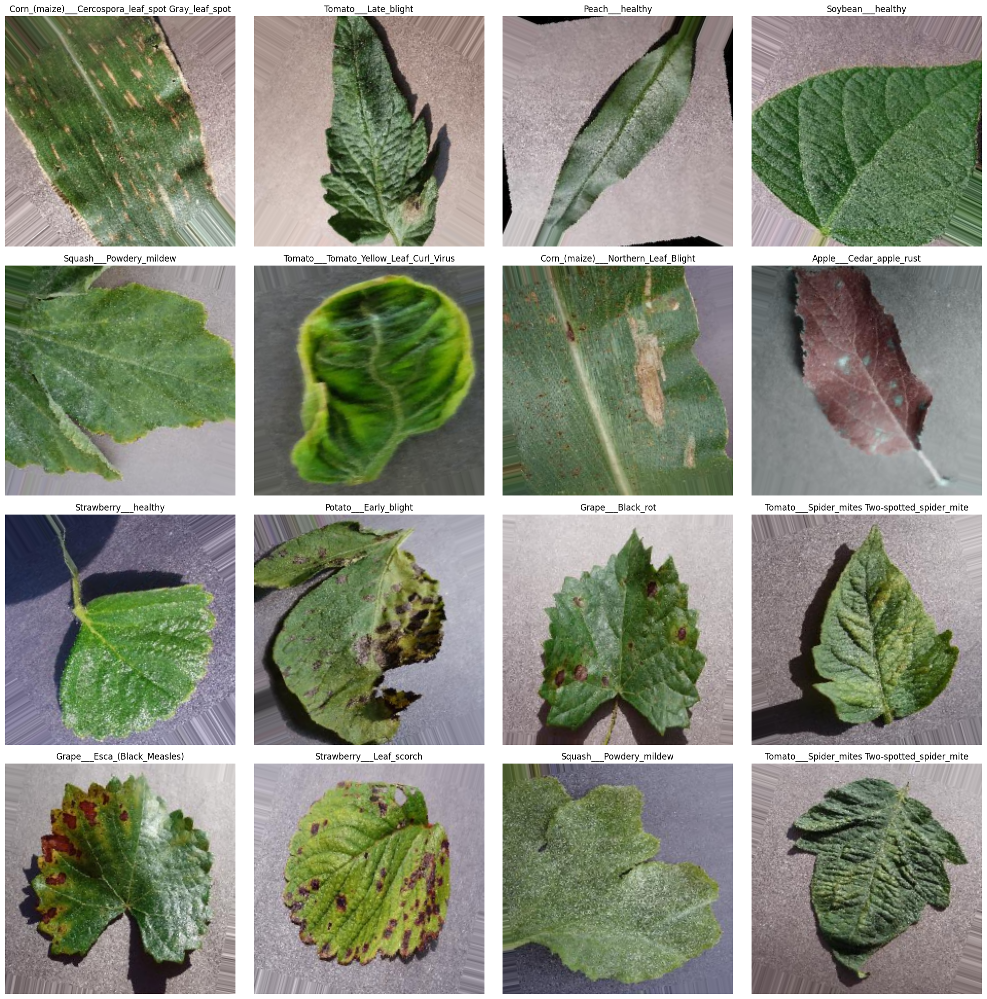

In [9]:
import numpy as np
import matplotlib.pyplot as plt

classes = list(train_generator.class_indices.keys())

plt.figure(figsize=(20, 20))
for X_batch, y_batch in train_generator:
    batch_size = X_batch.shape[0]
    num_images = min(16, batch_size)  # Ensure no index error

    for i in range(num_images):
        plt.subplot(4, 4, i + 1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.argmax(y_batch[i])], fontsize=12)
        plt.axis("off")  # Remove grid lines

    plt.tight_layout()
    plt.show()
    break


In [10]:
valid = '/root/.cache/kagglehub/datasets/vipoooool/new-plant-diseases-dataset/versions/2/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'

In [11]:
valid_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function = None,
    validation_split=0.1
).flow_from_directory(valid,
                      batch_size=164,
                      target_size=(size, size),
                      class_mode='categorical',
                      color_mode='rgb',
                      subset='validation',
                      shuffle=False)

Found 1742 images belonging to 38 classes.


In [12]:
test = '/root/.cache/kagglehub/datasets/vipoooool/new-plant-diseases-dataset/versions/2/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'
test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function = None
).flow_from_directory(test,
                      batch_size=164,
                      target_size=(224, 224),
                      color_mode='rgb',
                      class_mode = 'categorical',
                      shuffle = False)

Found 17572 images belonging to 38 classes.


In [13]:
test_generator.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

In [14]:
train_generator.class_indices


{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

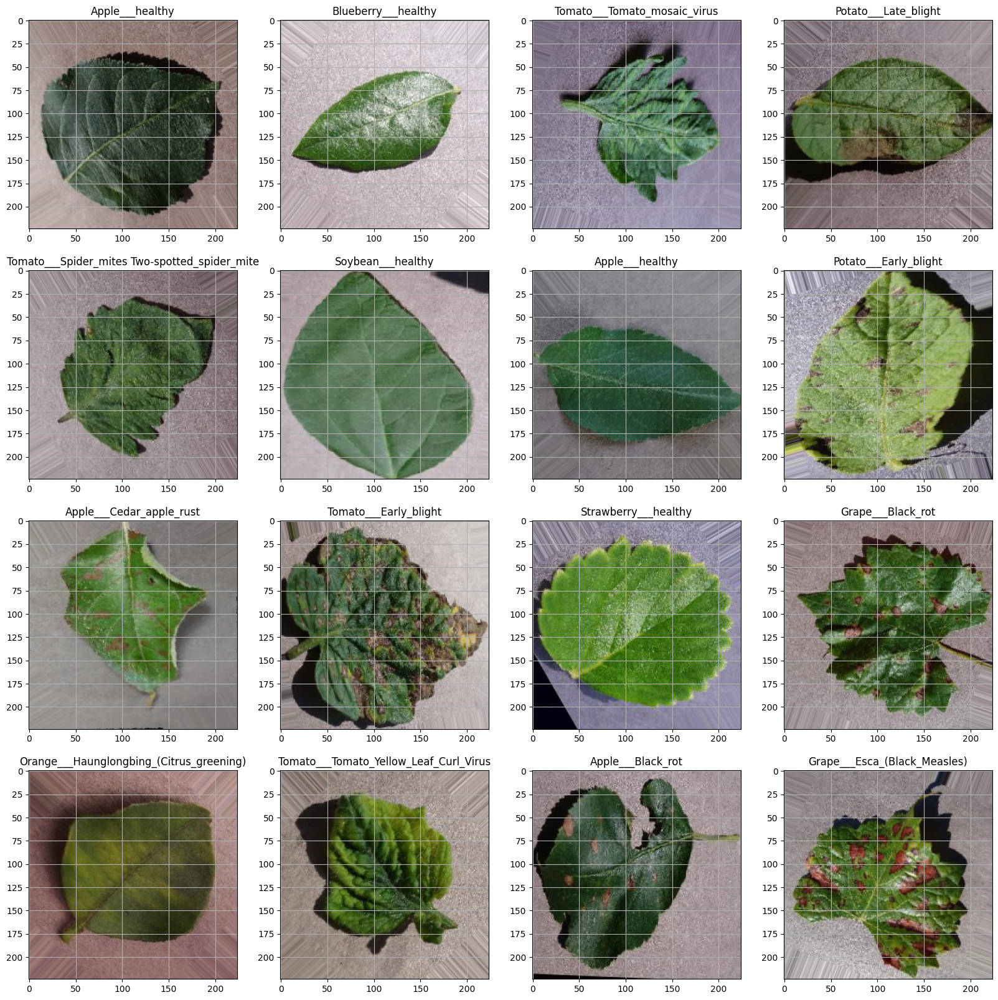

In [15]:
classes = list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
  for i in range(0, 16):
    plt.subplot(4, 4, i+1)
    plt.imshow(X_batch[i])
    plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    plt.grid(None)
  plt.show()
  break

In [16]:
valid_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values
    validation_split=0.1
).flow_from_directory(
    valid,
    target_size=(size, size),
    batch_size=164,
    class_mode='categorical',
    color_mode='rgb',
    subset='validation',
    shuffle=True  # Enable shuffling for better validation performance
)


Found 1742 images belonging to 38 classes.


In [17]:
test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255  # Normalize pixel values
).flow_from_directory(
    test,
    target_size=(224, 224),
    batch_size=164,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False  # Keep shuffle=False for test data to maintain order
)


Found 17572 images belonging to 38 classes.


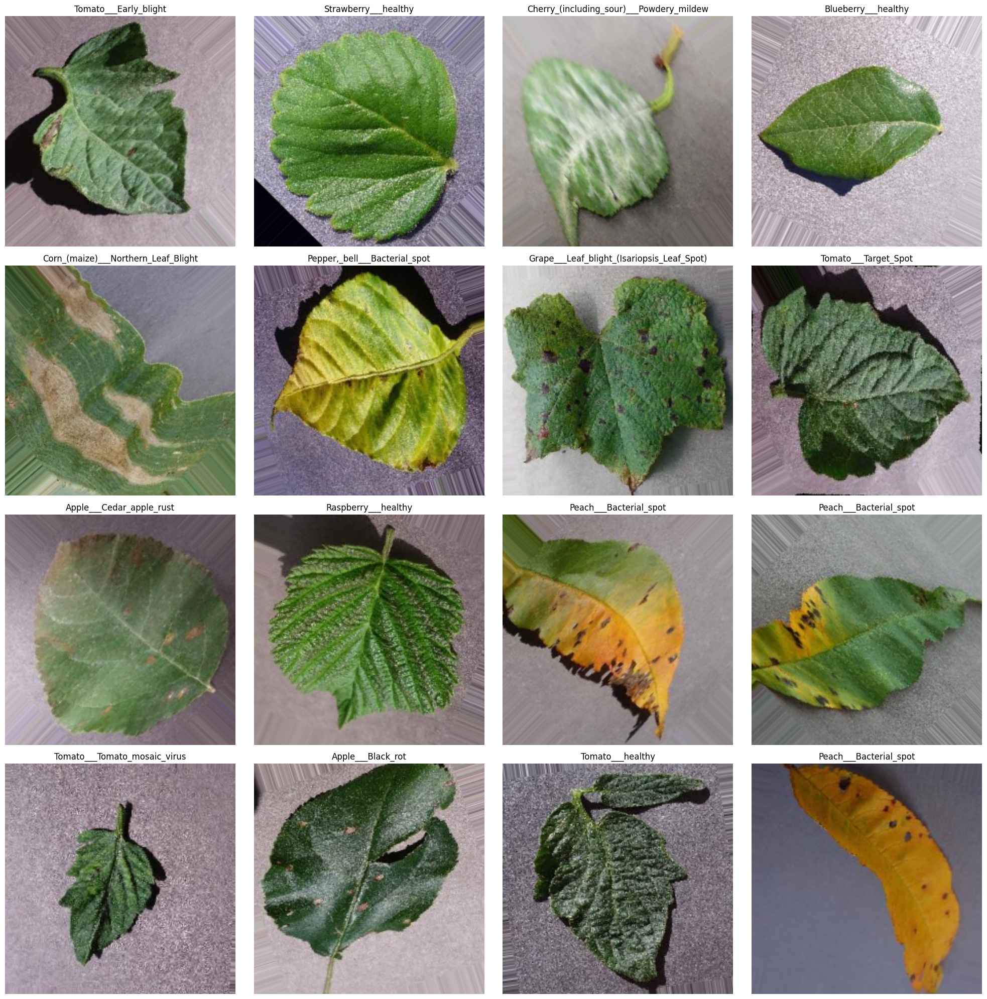

In [18]:
import numpy as np
import matplotlib.pyplot as plt

classes = list(train_generator.class_indices.keys())

plt.figure(figsize=(20, 20))

for X_batch, y_batch in train_generator:
    batch_size = X_batch.shape[0]
    num_images = min(16, batch_size)  # Prevent index errors if batch size < 16

    for i in range(num_images):
        plt.subplot(4, 4, i + 1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.argmax(y_batch[i])], fontsize=12)  # Use argmax for clarity
        plt.axis("off")  # Remove grid lines for better visualization

    plt.tight_layout()
    plt.show()
    break  # Stop after one batch


In [19]:
from tensorflow import keras
import tensorflow as tf

model = keras.models.Sequential([
    keras.layers.Conv2D(32, kernel_size=7, strides=1, padding='same',
                        activation='relu', name="Conv1", input_shape=(224, 224, 3)),
    keras.layers.MaxPool2D(pool_size=2, name="Pool1"),

    keras.layers.Conv2D(64, kernel_size=5, strides=1, padding='same',
                        activation='relu', name='Conv2'),
    keras.layers.MaxPool2D(pool_size=2, name="Pool2"),

    keras.layers.Conv2D(128, kernel_size=3, strides=1, padding='same',
                        activation='relu', name='Conv3'),
    keras.layers.MaxPool2D(pool_size=2, name="Pool3"),

    keras.layers.Conv2D(256, kernel_size=3, strides=1, padding='same',
                        activation='relu', name='Conv4'),
    keras.layers.MaxPool2D(pool_size=2, name="Pool4"),  # Added a pooling layer

    keras.layers.Flatten(name='Flatten1'),

    keras.layers.Dense(128, activation='relu', name='Dense1'),
    keras.layers.Dropout(0.5),  # Corrected Dropout placement

    keras.layers.Dense(64, activation='relu', name='Dense2'),
    keras.layers.Dropout(0.5),  # Corrected Dropout placement

    keras.layers.Dense(38, activation='softmax', name='Output')
])

print(model.summary())


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ Conv1 (Conv2D)                       │ (None, 224, 224, 32)        │           4,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pool1 (MaxPooling2D)                 │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Conv2 (Conv2D)                       │ (None, 112, 112, 64)        │          51,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pool2 (MaxPooling2D)                 │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Conv3 (Conv2D)                       │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pool3 (MaxPooling2D)                 │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Conv4 (Conv2D)                       │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pool4 (MaxPooling2D)                 │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Flatten1 (Flatten)                   │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense1 (Dense)                       │ (None, 128)                 │       6,422,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense2 (Dense)                       │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Output (Dense)                       │ (None, 38)                  │           2,470 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,858,406 (26.16 MB)

 Trainable params: 6,858,406 (26.16 MB)

 Non-trainable params: 0 (0.00 B)

None


In [20]:
from tensorflow import keras
import tensorflow as tf

model = keras.models.Sequential([
    keras.layers.Conv2D(32, kernel_size=7, strides=1, padding='same',
                        activation='relu', name="Conv1", input_shape=(224, 224, 3)),
    keras.layers.MaxPool2D(pool_size=2, name="Pool1"),

    keras.layers.Conv2D(64, kernel_size=5, strides=1, padding='same',
                        activation='relu', name='Conv2'),
    keras.layers.MaxPool2D(pool_size=2, name="Pool2"),

    keras.layers.Conv2D(128, kernel_size=3, strides=1, padding='same',
                        activation='relu', name='Conv3'),
    keras.layers.MaxPool2D(pool_size=2, name="Pool3"),

    keras.layers.Conv2D(256, kernel_size=3, strides=1, padding='same',
                        activation='relu', name='Conv4'),
    keras.layers.MaxPool2D(pool_size=2, name="Pool4"),  # Added missing pooling layer

    keras.layers.Flatten(name='Flatten1'),

    keras.layers.Dense(128, activation='relu', name='Dense1'),
    keras.layers.Dropout(0.5),  # Corrected Dropout placement

    keras.layers.Dense(64, activation='relu', name='Dense2'),
    keras.layers.Dropout(0.5),  # Corrected Dropout placement

    keras.layers.Dense(38, activation='softmax', name='Output')
])

print(model.summary())


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ Conv1 (Conv2D)                       │ (None, 224, 224, 32)        │           4,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pool1 (MaxPooling2D)                 │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Conv2 (Conv2D)                       │ (None, 112, 112, 64)        │          51,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pool2 (MaxPooling2D)                 │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Conv3 (Conv2D)                       │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pool3 (MaxPooling2D)                 │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Conv4 (Conv2D)                       │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pool4 (MaxPooling2D)                 │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Flatten1 (Flatten)                   │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense1 (Dense)                       │ (None, 128)                 │       6,422,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense2 (Dense)                       │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Output (Dense)                       │ (None, 38)                  │           2,470 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,858,406 (26.16 MB)

 Trainable params: 6,858,406 (26.16 MB)

 Non-trainable params: 0 (0.00 B)

None


In [21]:
import tensorflow as tf

model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)


In [22]:
history = model.fit(
    train_generator,
    epochs=5,
    validation_data=valid_generator,
    callbacks=callbacks if 'callbacks' in locals() else None  # Ensures callbacks is defined
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
386/386 ━━━━━━━━━━━━━━━━━━━━ 833s 2s/step - accuracy: 0.0505 - loss: 3.5564 - precision: 0.6413 - recall: 0.0096 - val_accuracy: 0.2233 - val_loss: 2.7377 - val_precision: 0.9552 - val_recall: 0.0367
Epoch 2/5
386/386 ━━━━━━━━━━━━━━━━━━━━ 747s 2s/step - accuracy: 0.2157 - loss: 2.6984 - precision: 0.6872 - recall: 0.0633 - val_accuracy: 0.3657 - val_loss: 2.1605 - val_precision: 0.8370 - val_recall: 0.1297
Epoch 3/5
386/386 ━━━━━━━━━━━━━━━━━━━━ 739s 2s/step - accuracy: 0.3477 - loss: 2.1819 - precision: 0.7039 - recall: 0.1495 - val_accuracy: 0.5350 - val_loss: 1.6078 - val_precision: 0.8665 - val_recall: 0.2796
Epoch 4/5
386/386 ━━━━━━━━━━━━━━━━━━━━ 737s 2s/step - accuracy: 0.4607 - loss: 1.7916 - precision: 0.7423 - recall: 0.2598 - val_accuracy: 0.6561 - val_loss: 1.2384 - val_precision: 0.8597 - val_recall: 0.4328
Epoch 5/5
386/386 ━━━━━━━━━━━━━━━━━━━━ 736s 2s/step - accuracy: 0.5357 - loss: 1.5236 - precision: 0.7695 - recall: 0.3552 - val_accuracy: 0.7055 - val_loss: 1.

In [27]:
import seaborn as sns

# Check available keys in history
print(history.history.keys())

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Ensure correct metric keys
precision = history.history.get('precision_1', history.history.get('precision'))
val_precision = history.history.get('val_precision_1', history.history.get('val_precision'))

recall = history.history.get('recall_1', history.history.get('recall'))
val_recall = history.history.get('val_recall_1', history.history.get('val_recall'))

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)


dict_keys(['accuracy', 'loss', 'precision', 'recall', 'val_accuracy', 'val_loss', 'val_precision', 'val_recall'])


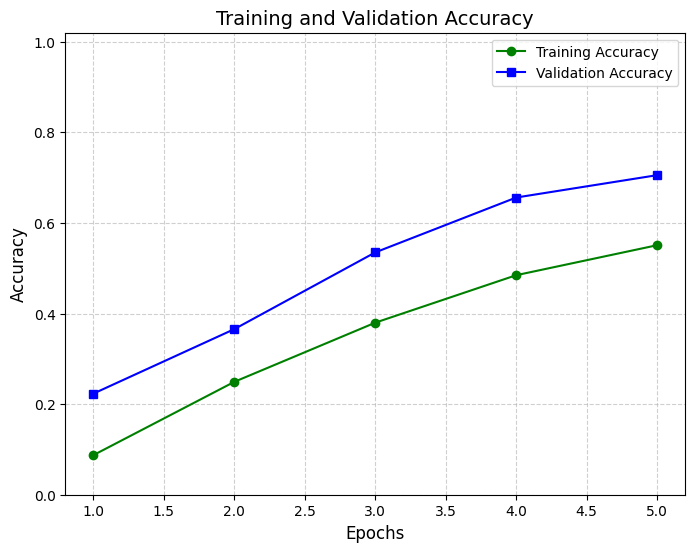

In [26]:
plt.figure(figsize=(8, 6))  # Adjust figure size for better clarity
plt.plot(epochs, acc, 'g-o', label='Training Accuracy')  # Green line with circle markers
plt.plot(epochs, val_acc, 'b-s', label='Validation Accuracy')  # Blue line with square markers

plt.title('Training and Validation Accuracy', fontsize=14)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.ylim(0, 1.02)  # Ensures the plot doesn't exceed bounds
plt.grid(True, linestyle='--', alpha=0.6)  # Add a light grid for better readability
plt.show()


In [25]:
# Save the model
model.save('cnn_model.keras')
